- Author: Ravi Teja Bhupatiraju
- Needs to be run with Coconut kernel, not Python

In [1]:
import math, re
import itertools as it

import datetime
import datetime, isoweek
from dateparser import parse as dtparse
from datetime import timedelta
from moment import Moment
from dateutil.parser import parse as dtparse
import us

import numpy as np
from scipy import stats
import pandas as pd
import geopandas as gpd
from tqdm import tqdm_notebook as nb
from tqdm.autonotebook import tqdm

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as mpatches
import matplotlib.dates as mdates
from matplotlib import rcParams

import seaborn as sns
from labellines import labelLine, labelLines
from pygantt.pygantt import gantt

from cycler import cycler
from sklearn.preprocessing import minmax_scale
from sklearn.cluster import KMeans

from IPython.core.display import display, HTML

from sciplotlib import style as spstyle
natrev = spstyle.get_style('nature-reviews')

C:\Anaconda\envs\ds\lib\site-packages\coconut\icoconut\__main__.py:19: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  


<AxesSubplot:>

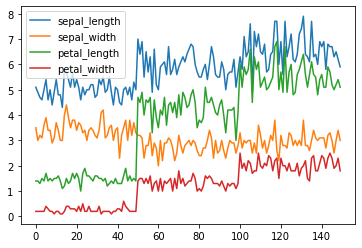

In [2]:
'iris' |> sns.load_dataset |> .plot() # Dummy plot as fix to ensure initialization of graphics

In [3]:
rcParams['figure.figsize'] = 28, 10
plt.rcParams.update({'font.size': 16})

tqdm.pandas()
'<style>.container { width:100% !important; }</style>' |> HTML |> display

In [4]:
# utils
def foreach(fn, lst):
    for e in lst: e |> fn

def axsave(ax, fn):
    ax.get_figure().savefig(fn, dpi=600)

def delete_extra_axes(fix, axes, n):
    foreach(fig.delaxes, axes.flatten()[-n:])

def reset_plot_settings():
    mpl.rcParams.update(mpl.rcParamsDefault)
    sns.reset_defaults()

In [5]:
#!wget https://github.com/descarteslabs/DL-COVID-19/raw/master/DL-us-mobility-daterow.csv -O DL-us-mobility-daterow.csv
#!wget https://github.com/CSSEGISandData/COVID-19/raw/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_US.csv -O ../time_series_covid19_confirmed_US.csv

In [6]:
# from Ridge NB
states_ordered_by_peak = [
    #'American Samoa',
    'Michigan', 'New Jersey', 'Vermont', 'New Hampshire', 'New York', 'Rhode Island', 'Wyoming', 'Connecticut', 'Pennsylvania', 'Colorado',
 'Massachusetts', 'Delaware', 'Nebraska',
    'Washington, D.C.', #'District of Columbia',
    'Maryland', 'Maine', 'Arizona', 'Florida', 'Tennessee', 'Idaho', 'Nevada', 'Oregon', 'Alabama', 'Georgia', 'North Carolina',
 'Alaska', 'Louisiana', 'Oklahoma', 'New Mexico', 'Ohio', 'Missouri', 'Mississippi', 'Washington', 'Virginia', 'Kentucky',
    #'Virgin Islands',
    'Hawaii', 'California',
    #'Guam',
    'Indiana', 'Kansas',
 'Iowa', 'South Dakota', 'Illinois', 'South Carolina', 'West Virginia', 'Arkansas', 'North Dakota', 'Wisconsin', 'Utah', 'Montana',
    #'Puerto Rico', 'Northern Mariana Islands',
    'Minnesota', 'Texas']

In [7]:
df_dc = pd.read_csv('DL-us-mobility-daterow.csv')

In [8]:
df_states = (
    df_dc
    [df_dc.admin_level == 1]
    [['date', 'admin1', 'm50_index']]
    .rename(columns={'admin1': 'state'})
    .pivot(index='date', columns='state')
    [['m50_index']]
)
df_states.to_excel('Descartes_State.xlsx')

In [9]:
df_cases = pd.read_csv('time_series_covid19_confirmed_US.csv')
df_cases.Province_State = df_cases.Province_State.replace('District of Columbia', 'Washington, D.C.')

In [10]:
# Calc peaks
dt_cols = df_cases.columns[11:]
df_stsum = df_cases[['Province_State',  *dt_cols]].groupby('Province_State').sum().T.reset_index().rename(columns = {'index': 'Date'})
df_stsum['week_no'] = pd.to_datetime(df_stsum['Date']).dt.week.sum()
df_ = df_stsum.set_index(['Date', 'week_no']).diff().reset_index()
df_ = df_.drop(columns=['Date'])
df_ = df_.groupby('week_no').sum().rolling(3, min_periods=1).mean().round(0)

C:\Anaconda\envs\ds\lib\site-packages\coconut\icoconut\__main__.py:4: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  # -----------------------------------------------------------------------------------------------------------------------


In [11]:
df_stsum.to_csv('Cases.csv')

In [12]:
dLookupMax = df_.iloc[:,:].max() |> pd.DataFrame |> .T |> .to_dict('records') |> .[0]

In [13]:
# Rule dataset
dStatePop = pd.read_csv('StatePopulations.csv').set_index('State').T.to_dict('records')[0]
dStatePop['Washington, D.C.'] = dStatePop.pop('District of Columbia')

In [14]:
df = df_stsum.copy()
df['week_day'] = df.Date.apply(->Moment(_).weekday)
df = df[df.week_day == 7]

df_IncPop = pd.DataFrame()
df_IncPop['Date'] = df['Date']
df_IncPop['week_no'] = df['Date'].apply(->Moment(_).datetime.isocalendar()[1])
df_IncPopDiff = df_IncPop.copy()

for s in dStatePop:
    if s in df.columns:
        df_IncPop[s] = round((df[s] / dStatePop[s]) * 100, 2)
        df_IncPopDiff[s] = df[s].diff().fillna(0)
del df

In [15]:
df_IncPop.to_csv('StateIncPop.csv')
df_IncPopDiff.to_csv('StateIncPopDiff.csv')

In [16]:
df = df_states.reset_index().copy()
df['week_day'] = df.date.apply(->Moment(_).weekday)
df['week_no'] = df.date.apply(->Moment(_).datetime.isocalendar()[1])
df = df[df.week_day == 7]
df.columns = [(x if y == '' else y) for x, y in map(df.columns.get_level_values, [0,1]) |*> zip]
df.to_csv('StateWeeklyMobility.csv')

In [17]:
cols = df.columns[1:-2]
df[cols] = df[cols].diff().fillna(0)
df.to_csv('StateWeeklyMobilityDiff.csv')

In [18]:
# divide state cases by pop
# 1.) CumlCases 2.) CumlCases/Pop 3.) Diff from previous - all by week (check every Monday - after calc weekno)
# to categorical (equidepth binning, adjust width)
# do that for mobility as well (just 3 i.e. diff).

In [19]:
early_states = {}
for col in df_.columns:
    v = dLookupMax[col]
    tdf = df_[[col]].reset_index()
    row = tdf[tdf[col]==v]
    #print(col, row.iloc[0]['week_no'])
    early_states[col] = row.iloc[0][col].astype(int)

In [20]:
def weekno2month(w):
    d = '2020-W' + str(w).zfill(2)
    r = datetime.datetime.strptime(d + '-1', "%Y-W%W-%w")
    return r.month

def weekno2date(w):
    d = '2020-W' + str(w).zfill(2)
    r = datetime.datetime.strptime(d + '-1', "%Y-W%W-%w")
    return r.date()

#weekno2month(54)

In [21]:
def get_date_with_max_cases(df):
    df = df.copy()
    df.columns = ['Date', 'Value']
    df.Value = df.Value.diff().fillna(0).astype(int)
    return df[df.Value == df.Value.max()].Date.values[0]

s = 'Alaska'
get_date_with_max_cases(df_stsum[['Date', s]])

'11/14/20'

In [22]:
g1, g2, g3 = [], [], []
for s in df_stsum.columns[1:-1]:
    df = df_stsum[['Date', s]]
    d = get_date_with_max_cases(df)
    m = d.split('/')[0] |> int
    #print(s, m)
    if m < 7:
        s |> g1.append
    elif m < 9:
        s |> g2.append
    else:
        s |> g3.append

In [23]:
#g1, g2, g3

<AxesSubplot:xlabel='Date'>

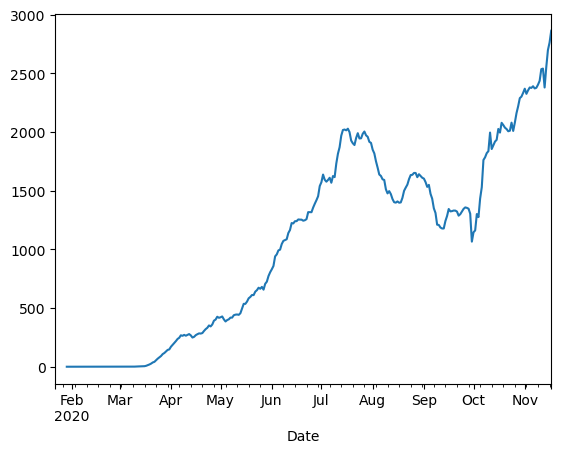

In [24]:
reset_plot_settings()

dt_cols = df_cases.columns[11:]
df_ = df_cases[['Province_State',  *dt_cols]].groupby('Province_State').sum().T.reset_index().rename(columns = {'index': 'Date'})

df_.Date = df_.Date |> pd.to_datetime
df_ = df_.set_index('Date')
df_['North Carolina'].diff().rolling(7).mean().plot()

<AxesSubplot:xlabel='Date'>

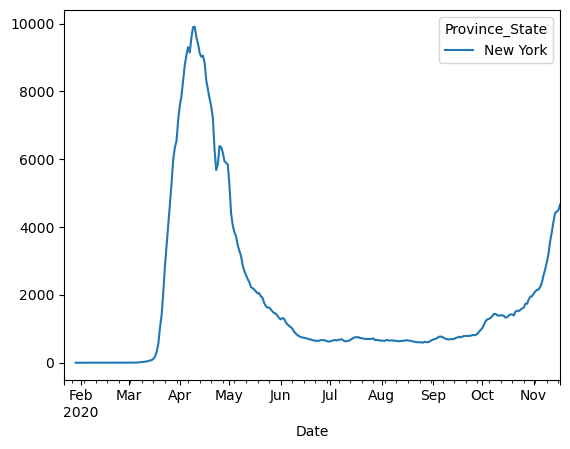

In [25]:
df_[['New York']].diff().rolling(7).mean().plot()

In [26]:
df_m = df_dc[['date', 'admin1', 'm50_index', 'admin_level']]
df_m[df_m.admin_level == 1][['date', 'admin1', 'm50_index']]
df_pivot = pd.pivot_table(df_m, index='date', columns=['admin1'], values='m50_index', aggfunc=np.mean)
df_m = df_pivot.applymap(lambda x: 400 if x > 400 else x).rolling(30, min_periods=7).mean()

In [27]:
rcParams['figure.figsize'] = (30, 8)

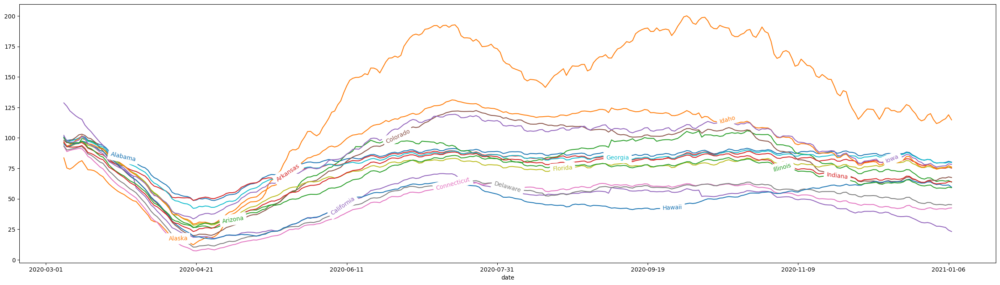

In [28]:
df_m[df_m.columns[:15]].plot(legend=False)
_ = labelLines(plt.gca().get_lines(), zorder=2.5)

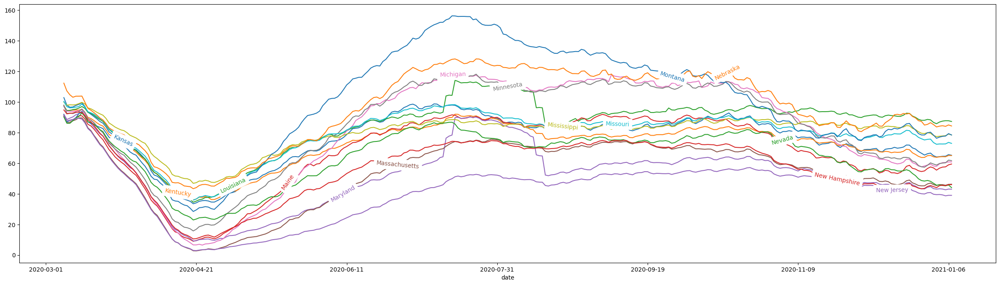

In [29]:
df_m[df_m.columns[15:30]].plot(legend=False)
_ = labelLines(plt.gca().get_lines(), zorder=2.5)

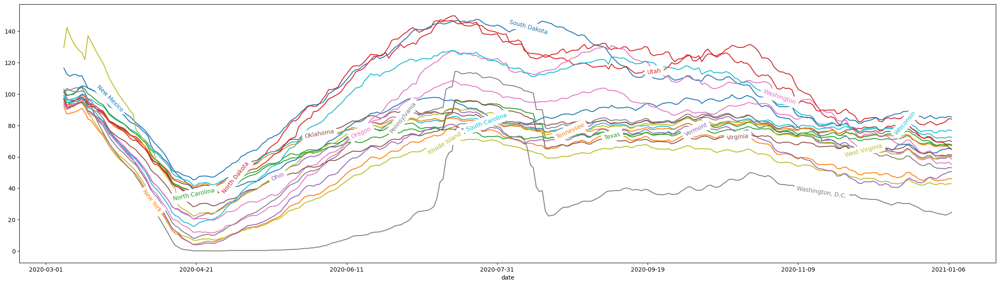

In [30]:
df_m[df_m.columns[30:50]].plot(legend=False)
_ = labelLines(plt.gca().get_lines(), zorder=2.5)

In [31]:
df_ = df_m[df_m.columns[:]]
cols = df_.columns
df_s = pd.melt(df_.reset_index().dropna(), id_vars='date', value_vars=cols)
df_speaks = pd.read_excel('Correlation_DesCartes_Incidence_Phases_Actual_Spearman.xlsx', usecols=['state', 'peak'])
df_s = df_s.merge(df_speaks, left_on='admin1', right_on='state').drop(columns='admin1')

In [32]:
df_speaks.to_csv('StatePeaks.csv', index=False)

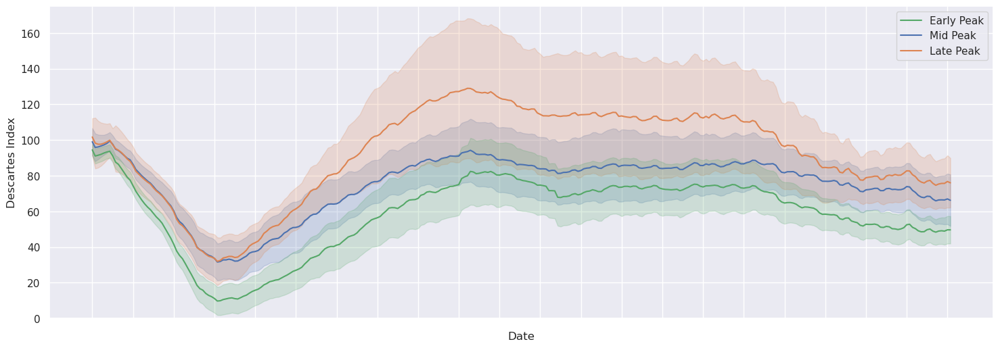

In [33]:
def process(s):
    if s < 7:
        return 'Early Peak'
    elif s < 9:
        return 'Mid Peak'
    else:
        return 'Late Peak'

df_s['Peak Group'] = df_s.peak.apply(process)

reset_plot_settings()
sns.set_style({'font.family': ['Open Sans']})
sns.set_style('whitegrid')
sns.set(rc={'figure.figsize':(18, 6)})

g = sns.lineplot(data=df_s, x='date', y='value', ci='sd', hue='Peak Group')
g.set_xlabel('Date')
g.set_ylabel('Descartes Index') # TODO Have date as Mar 3 etc
g.set_ylim(0, 175)
#g.set_xticklabels(labels=df_s.date.apply(->Moment(_).datetime.strftime('%b %d')), rotation=90)

# order legend properly
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,0,1]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

new_ticks = [i.get_text() for i in g.get_xticklabels()]
_ = plt.xticks(range(0, len(new_ticks), 14), new_ticks[::14])

reset_plot_settings()
# TODO: Same colors as map. Larger labels, no year in labels.

In [34]:
# get mean drop of cases by Peak Group
df_s[['date', 'value', 'state', 'Peak Group']].groupby('state').min().groupby('Peak Group').mean().reset_index().rename(columns={'value': 'MeanMinMob'}).round()

,Peak Group,MeanMinMob
0,Early Peak,10.0
1,Late Peak,32.0
2,Mid Peak,31.0


In [35]:
# get current return by Peak Group
df_ = df_s[['date', 'value', 'state', 'Peak Group']].copy()
df_['date'] = df_.date |> pd.to_datetime
df_[df_.date > '2020-09-01' |> pd.to_datetime].groupby('state').max().groupby('Peak Group').mean().reset_index().rename(columns={'value': 'MeanMaxMob'}).round()

,Peak Group,MeanMaxMob
0,Early Peak,77.0
1,Late Peak,121.0
2,Mid Peak,92.0


In [36]:
axsave(g, 'StateBandsV2.png')

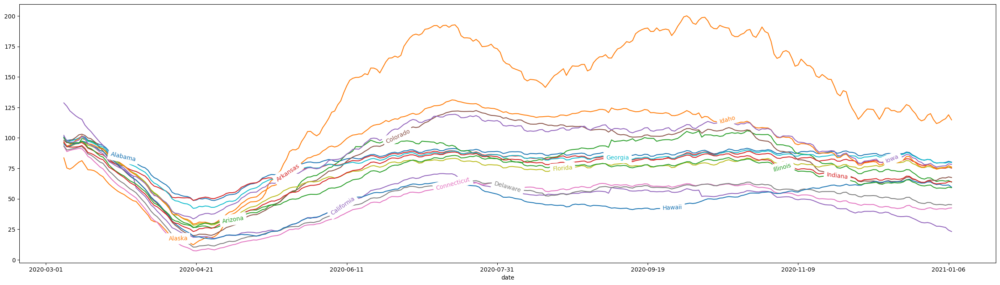

In [37]:
#sns.lineplot
rcParams['figure.figsize'] = (30, 8)
df_m[df_m.columns[:15]].plot(legend=False)
_ = labelLines(plt.gca().get_lines(), zorder=2.5)

In [38]:
df_ = df_cases[['Province_State', *df_cases.columns[11:]]].groupby('Province_State').sum()
df_.columns = ['c_' + c for c in df_.columns]

In [39]:
df_deaths = pd.read_csv('time_series_covid19_deaths_US.csv')
df_deaths.Province_State = df_deaths.Province_State.replace('District of Columbia', 'Washington, D.C.')

dMaxCases = df_cases[['Province_State', df_cases.columns[-1]]].groupby('Province_State').sum().T.to_dict('records')[0]
dMaxDeaths = df_deaths[['Province_State', df_deaths.columns[-1]]].groupby('Province_State').sum().T.to_dict('records')[0]

df_pop = pd.read_csv('PopState.csv')
dPop = df_pop[['State', 'Pop_sqmi']].set_index('State')[['Pop_sqmi']].T.to_dict('records')[0]

In [40]:
def get_state_stats(n): return pd.read_excel('StateStats.xlsx', sheet_name=n).set_index('State')
def ljoin(df1, df2): return df1.join(df2, how='left', lsuffix='_')

df_phouse, df_dens, df_mhi, df_testing = map(get_state_stats, ['PerHouse', 'PopDensity', 'MedHIncome', 'Testing'])

In [41]:
df_wave = pd.read_csv('single_wave_simulation_incidence.csv')
df_wave = df_wave.set_index('week').T
df_wave.columns = ['w' + str(c).zfill(2) for c in df_wave.columns]

In [42]:
df = df_phouse |> ljoin$(df_dens) |> ljoin$(df_mhi)
df = df[df.columns |> filter$(->'Rank' not in _)].fillna('—').replace('—', '')

df_ = df_states.T.reset_index().set_index('state')
df_.columns = [c.replace('2020', 'M_2020') for c in df_.columns]
df = df.join(df_.iloc[:,1:], how='left')

df = df.join(df_wave).fillna('')

In [43]:
df.to_csv('StateDemo.csv')

In [44]:
states = [col[1] for col in df_states.columns]
#states

C:\Anaconda\envs\ds\lib\site-packages\coconut\icoconut\__main__.py:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  # -----------------------------------------------------------------------------------------------------------------------


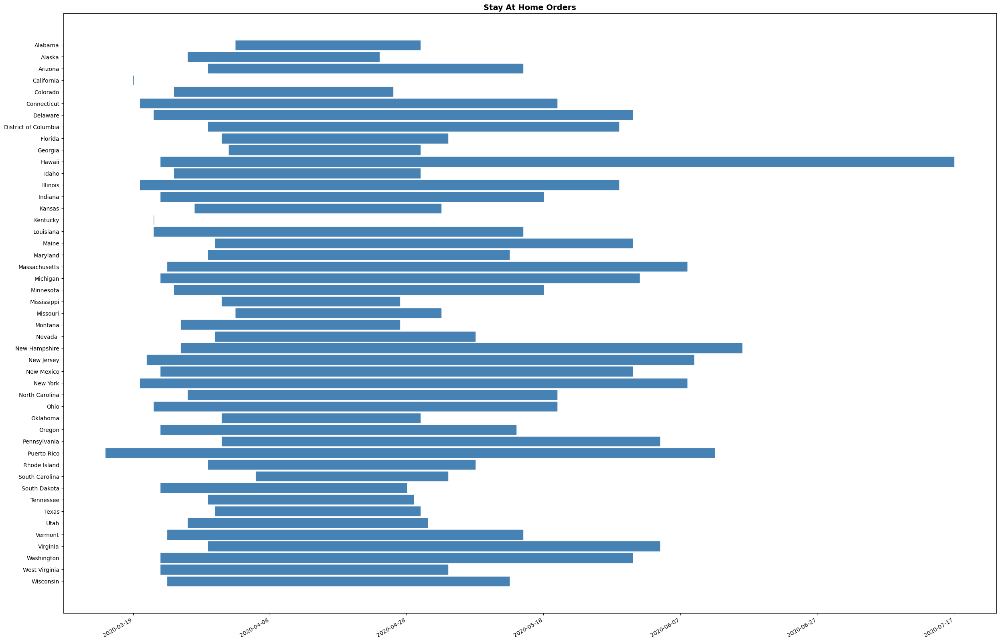

In [45]:
df_stay = pd.read_csv('Stay.csv')
df_stay = df_stay[['State', 'Order Date', 'Expire Date']].rename(columns={'Order Date': 'Start', 'Expire Date': 'Finish'})

df_stay['State'] = df_stay['State'].str.replace('*', '')

df_stay['Start'] = pd.to_datetime(df_stay['Start'])
df_stay['Finish'] = pd.to_datetime(df_stay['Finish'])

df_stay['Type'] = 'main'
fig = plt.figure(figsize=(30,22))
gantt(task=df_stay.State, start=df_stay.Start, finish=df_stay.Finish, task_type=df_stay.Type, color={'main':'steelblue', 'sub':'lightgreen'})
plt.title('Stay At Home Orders', {'fontsize': 14, 'fontweight' : 'heavy'});
fig.savefig('StayAtHome.png')

In [46]:
df_cons = pd.read_csv('State_Consolidated_Mobility_Miles_New_Actionable_Oct20.csv')
df_cons['startDayWeek'] = df_cons['startDayWeek'] |> pd.to_datetime

In [47]:
def lag_read(sheet, idx):
    return pd.read_excel('Correlation_DesCartes_Incidence_Phases_Actual_Extended.xlsx', sheet_name=sheet)[['state', idx]].set_index('state').T.to_dict('records')[0]

dState_cs = lag_read('CompleteSeries', -4)
dState_p1 = lag_read('Phase1', -3)
dState_p2 = lag_read('Phase2', -2)
dState_p3 = lag_read('Phase3', -5)
dState_p4 = lag_read('Phase4', -3)

def dict_get(k, d):
    v = d.get(k, '')
    if v == '':
        return v
    elif math.isnan(v):
        return ''
    else:
        return round(v, 2)

In [48]:
df_phases = pd.read_csv('phases_phase1(20201020_153121).csv')

def phase_slices(state):
    end_points = df_phases[state].tolist()
    #del end_points[2]
    return list(zip(end_points, end_points[1:]))

In [49]:
def closest_date(dt, dates):
    dt = dt |> dtparse
    vals= map((->dt - _), dates) |> map$(->abs(_)) |> list
    return vals |> min |> vals.index

#linestyles = ['-', '--', '-.', ':']

In [50]:
df = 'Mask_Mandates.csv' |> pd.read_csv
df['State'] = df['State'].apply(->re.findall('\[(.*?)\]', _)[0])
cols = ['CATEGORY', 'Requirement Date']
df[cols] = df[cols].fillna('')
df = df[['State', 'Requirement Date', 'Masks Required', 'CATEGORY']]
dDate, dM, dC = df.set_index('State').T.to_dict('records')
dMask = {k: (dDate[k] |> pd.to_datetime, dM[k], dC[k]) for k in dDate}
#df.to_csv('Mask.csv')

In [51]:
def week_firstday(p_year, p_week):
    return datetime.datetime.strptime(f'{p_year}-W{int(p_week )- 1}-1', "%Y-W%W-%w").date()

def subplot(df, ax, f, ls, c):
    df[[f]].rename(columns={'cases': 'cases', 'desCartes': 'mobility', 'Incidence': 'LGM'}).plot(ax=ax, linestyle=ls, color=c)

Wall time: 8.3 s
Parser   : 2.59 s


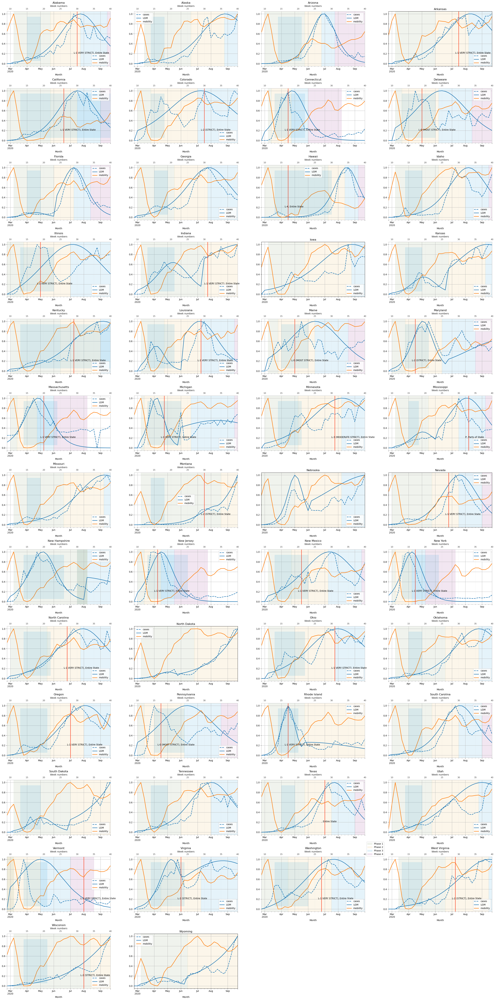

In [52]:
%%time
# TODO: Move mandate left
# TODO: startDayofWeek to Month
end_date = '2020-11-15' |> pd.to_datetime
fig, axes = plt.subplots(ncols=4, nrows=13, sharex=False, sharey=False, figsize=(30, 60))
states = df_cons.state.unique()# |> .[2]

import matplotlib.patches as mpatches

pp = (c, l)->mpatches.Patch(color=c, label=l, alpha=0.1)
r1 = pp('#6D904F', 'Phase 1')
r2 = pp('#E5AE38', 'Phase 2')
r3 = pp('#008FD5', 'Phase 3')
r4 = pp('#810F7C', 'Phase 4')
legend1 = plt.legend(handles=[r1, r2, r3, r4], loc=2)

#plt.style.use('presentation2.mplstyle')
reset_plot_settings()
with plt.style.context('presentation2.mplstyle') as c:
    all_data = {}
    for i, ax in axes.flatten() |> enumerate:
        if states |> len > i:
            state = states[i]
            
            # title
            mxc = dMaxCases[state]
            mxd = dMaxDeaths[state]
            popd = dPop.get(state, '')
            cs, p1, p2, p3, p4 = [dict_get(state, d) for d in (dState_cs, dState_p1, dState_p2, dState_p3, dState_p4)]
            ax.set_title(f'{state}')
            #ax.set_title(f'{state} Max Cases: {mxc}  Max Deaths: {mxd}  PopDens: {popd}\n CS: {cs} P1: {p1} P2: {p2} P3: {p3} P4: {p4}')
            
            # scale and subplot
            df = df_cons[df_cons.state == state][['startDayWeek', 'cases', 'desCartes', 'Incidence']].copy()
            df = df.set_index('startDayWeek')
            df = df[~df.index.duplicated(keep='first')].copy() # fix. Should I be using df_cons at all?
            
            df['desCartes'] = df['desCartes'].rolling(2, min_periods=1).mean()
            df[['cases', 'desCartes', 'Incidence']] = df[['cases', 'desCartes', 'Incidence']] |> minmax_scale
            
            sp = subplot$(df, ax)
            sp('cases', '--', 'C0')
            sp('Incidence', '-', 'C0')
            sp('desCartes', '-', 'C1')
            
            # phase colors
            colors = ('#6D904F', '#E5AE38', '#008FD5', '#810F7C')
            try:
                for i, phase in phase_slices(state) |> enumerate:
                    s, f = phase
                    ss = week_firstday(2020, s)
                    ff = week_firstday(2020, f)
                    ax.axvspan(ss, ff, alpha=0.1, color=colors[i])
            except:
                pass
            
            all_data[state] = df
            
            # stay-at-home block
            df_fill = df_stay[df_stay.State == state]
            if df_fill.shape[0] > 0:
                
                # start and finish dates
                ff = (->_.tolist()[0]) ..> str ..> (->_[:10] if type(_) != pd.NaT else _) ..> pd.to_datetime
                s = df_fill.Start  |> ff
                f = df_fill.Finish |> ff
                f = end_date if type(f) == pd.NaT |> type else f
                
                args = dict(ymin=0.10, ymax=0.90, alpha=0.1, color='#008FD5', zorder=3)
                ax.axvspan(s, f, **args, ) if s != f else ax.axvspan(s, end_date, **args) # is -2 justified? 32 is xmax.
                
                weeks = pd.Int64Index(df.index.isocalendar().week)
                #weeks = pd.Int64Index(df.index.week)
                xlim = (weeks.min(), weeks.max())
                
                ax2 = ax.twiny()
                ax2.set_xlim(xlim)
                ax2.set_xlabel(r'Week numbers')
            
            # masking
            dt, m, c = dMask[state]
            if '2020' in str(dt):
                lbl = f'{c}, {m}'
                ax.axvline(x=dt, color='#FC4F30')
                ax.text(dt - timedelta(days=7), 0.2, lbl)
                
            ax.set_xlabel('Month')
    
    fig.add_artist(legend1)
    foreach(fig.delaxes, axes.flatten()[-2:])
plt.tight_layout()

In [53]:
fig.savefig('StateCurves_538Hex.png', dpi=300)

In [54]:
peak_states = ['Idaho','Ohio','Oregon','Texas','Nevada','Hawaii','Georgia','Florida','Alabama','Tennessee','Arizona',
               'California','Mississippi','Iowa','Louisiana','Kentucky','New Mexico','Washington','North Carolina','South Carolina']
non_peak_states = states |> set |> .difference(peak_states |> set) |> list

Wall time: 5.76 s
Parser   : 2.68 s


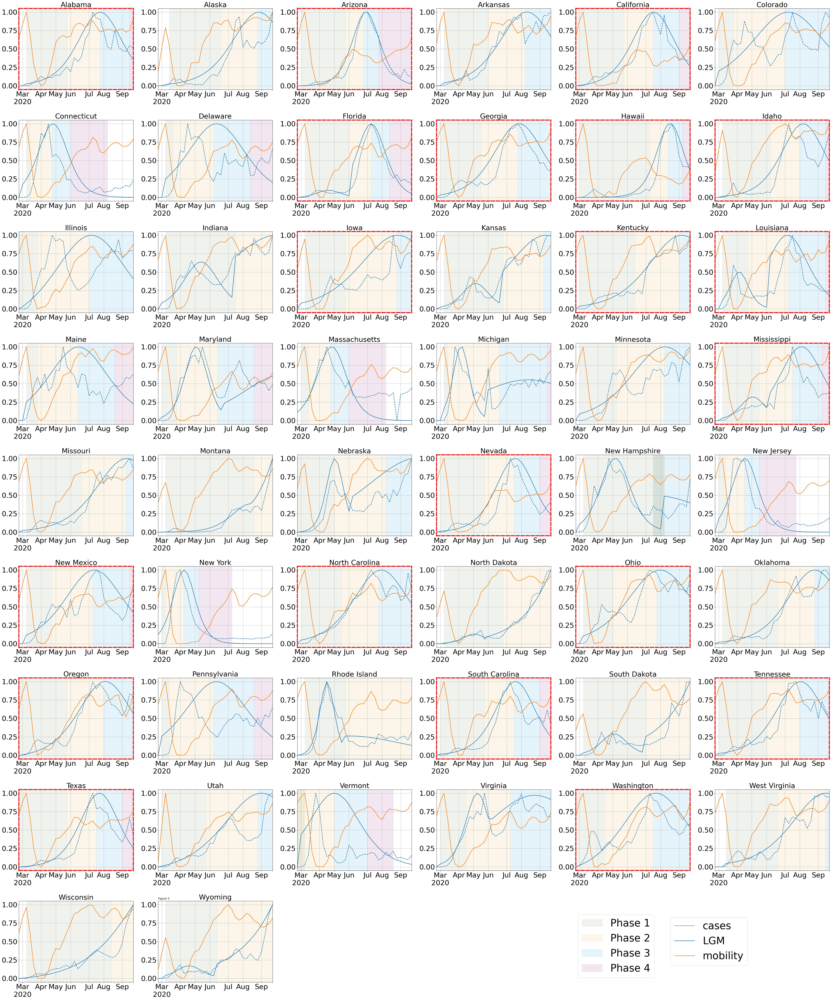

In [55]:
%%time
# Mask Paper Jan 4

reset_plot_settings()

font_size = 30
mpl.rcParams['font.size'] = font_size

end_date = '2020-11-15' |> pd.to_datetime
fig, axes = plt.subplots(ncols=6, nrows=9, sharex=False, sharey=False, figsize=(50, 60))
states = df_cons.state.unique()

pp = (c, l)->mpatches.Patch(color=c, label=l, alpha=0.1)
r1 = pp('#6D904F', 'Phase 1')
r2 = pp('#E5AE38', 'Phase 2')
r3 = pp('#008FD5', 'Phase 3')
r4 = pp('#810F7C', 'Phase 4')

#with natrev |> plt.style.context:
with plt.style.context('presentation2.mplstyle') as c:
    all_data = {}
    for i, ax in axes.flatten() |> enumerate:
        if states |> len > i:
            state = states[i]
            ax.set_title(f'{state}', fontsize=font_size)
            
            # scale and subplot
            df = df_cons[df_cons.state == state][['startDayWeek', 'cases', 'desCartes', 'Incidence']].copy()
            df = df.set_index('startDayWeek')
            df = df[~df.index.duplicated(keep='first')].copy() # fix. Should I be using df_cons at all?
            
            df['desCartes'] = df['desCartes'].rolling(2, min_periods=1).mean()
            df[['cases', 'desCartes', 'Incidence']] = df[['cases', 'desCartes', 'Incidence']] |> minmax_scale
            
            sp = subplot$(df, ax)
            sp('cases', '--', 'C0')
            sp('Incidence', '-', 'C0')
            sp('desCartes', '-', 'C1')
            
            # phase colors
            colors = ('#6D904F', '#E5AE38', '#008FD5', '#810F7C')
            try:
                for i, phase in phase_slices(state) |> enumerate:
                    s, f = phase
                    ss = week_firstday(2020, s)
                    ff = week_firstday(2020, f)
                    ax.axvspan(ss, ff, alpha=0.1, color=colors[i])
            except:
                pass
            
            # highlight
            if state in peak_states:
                for side in ['bottom', 'top', 'right', 'left']:
                    ax.spines[side].set_color('red')
                    ax.spines[side].set_linewidth(4.0)
                    ax.spines[side].set_linestyle('--')
            
            ax.set_xlabel('') # no need for month
            all_data[state] = df
            handles, labels = ax.get_legend_handles_labels()
            ax.get_legend().remove()
    
    legend1 = plt.legend(handles=[r1, r2, r3, r4], loc='lower right', bbox_to_anchor=(0, -1.2), fontsize='x-large')
    fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(0.9, 0.035), fontsize='x-large')
    fig.add_artist(legend1)
    foreach(fig.delaxes, axes.flatten()[-4:])
    plt.title('Figure 3', loc='left')
    plt.tight_layout()

In [56]:
#fig.savefig('StateCurves_Highlighted_8.png', dpi=300)

In [57]:
df_reopen = pd.read_csv('Reopening_Phases.csv')
toDate = (-> _ |> Moment |> .datetime)
df_reopen['StartDate'] = df_reopen.StartDate.apply(toDate)
df_reopen['EndDate'] = df_reopen.EndDate.apply(toDate)
df_mask =  pd.read_csv('MaskMandatesv2.csv')

In [58]:
# 'startDayWeek', 'cases', 'desCartes'
date_cols = df_cases.columns[11:].tolist()
df1 = df_cases[['Province_State', *date_cols]].groupby('Province_State').sum().diff(axis=1).reset_index().melt(id_vars='Province_State', var_name='startDayWeek', value_name='cases').rename(columns={'Province_State': 'state'})
#df1['startDayWeek'] = df1['startDayWeek'].apply(-> _ |> Moment |> .strftime('%Y-%m-%d'))
df1['startDayWeek'] = df1['startDayWeek'].apply(-> _ |> Moment |> .date)
df1['cases'] = df1['cases'].fillna(0).apply(int)

def process(c):
    return c[0] if c[1] == '' else c[1]

df2 = df_states.reset_index()
df2.columns = [process(c) for c in df2.columns]
df2 = df2.melt(id_vars='date', var_name='state', value_name='Descartes').rename(columns={'date': 'startDayWeek'})
df2['startDayWeek'] = df2['startDayWeek'].apply(-> _ |> Moment |> .date)

df3 = df1.merge(df2)

In [59]:
df3 = df3[df3.startDayWeek <= '2020-11-30' |> pd.to_datetime]

In [60]:
def get_change_weeks(state, df_mask):
    df_ = df_mask[df_mask.state == state]
    c = df_.columns.tolist()[1:]
    v = df_.values[0][1:].tolist()
    data = zip(c, v) |> list
    
    weeks, phases = [], []
    pw, po = None, None
    for i, (w, o) in data |> enumerate:
        
        # first case. pw and po not initialized
        if not pw:
            pw = w
            po = o
            weeks.append(w)
            phases.append(v[i])
            continue
        
        # change
        if o != po:
            weeks.append(w)
            phases.append(v[i])
        
        # set prev
        pw = w
        po = o
    
    # add last week as bound
    weeks.append(w)
    
    return weeks, phases

In [61]:
#!wget "https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population"# -o StatePop.html

In [62]:
#df_pop = pd.read_html('https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population')[0].iloc[:, 2:4]
#df_pop.columns = ['State', 'Pop']

In [63]:
#df_pop.to_csv('Pop.csv', index=False)

In [64]:
#df_pop = pd.read_html('https://en.wikipedia.org/wiki/List_of_states_and_territories_of_the_United_States_by_population')[0][[('State', 'State'), ('Census population', 'EstimatedJuly 1, 2019[8]')]]
#df_pop.columns = ['State', 'Pop']

In [65]:
df_pop = pd.read_csv('Pop.csv')

In [66]:
# How much did mobility drop between given dates
rows = []
for state in all_data:
    df = all_data[state]
    df = df.rename(columns={'desCartes': 'Descartes'})
    s = df[df.index == '2020-06-29' |> pd.to_datetime].Descartes.values[0]
    e = df[df.index == '2020-09-28' |> pd.to_datetime].Descartes.values[0]
    row = {'state': state, 'start': s, 'end': e}
    rows.append(row)
df = pd.DataFrame(rows)
#df['diff'] = df['start'] - df['end']
#df.to_csv('MobilityDiff.csv')

In [67]:
df.head()

,state,start,end
0,Alabama,0.795031,0.914037
1,Alaska,0.881094,1.000000
2,Arizona,0.405730,0.645287
3,Arkansas,0.820588,0.945882
4,California,0.466786,0.553501


In [68]:
df_ = df_dens.join(df_cases[['Province_State', *df_cases.columns[11:]]].groupby('Province_State').sum())

In [69]:
def process(r):
    pop = r.Pop_2013 |> int
    return (r.iloc[4:].astype('int') / pop) * 100_000
df_adjc = df_.apply(process, axis=1).round(2)

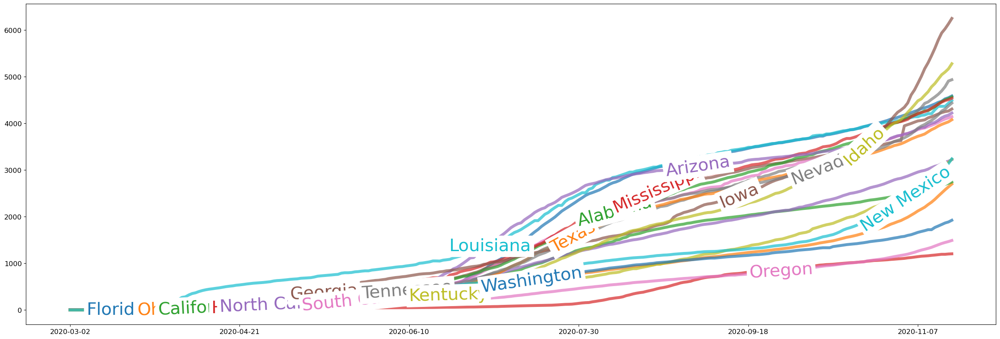

In [70]:
df_ = df_adjc[df_adjc.index.isin(peak_states)].T
df_.index = df_.index |> pd.to_datetime
df_ = df_[df_.index > '2020-03-01' |> pd.to_datetime]
df_.index = df_.index |> .strftime('%Y-%m-%d')

ax = df_.iloc[:, :].plot(figsize=(30, 10), fontsize=12, legend=False, alpha=0.7, linewidth=5)
_ = labelLines(plt.gca().get_lines(),zorder=2.5)

<AxesSubplot:>

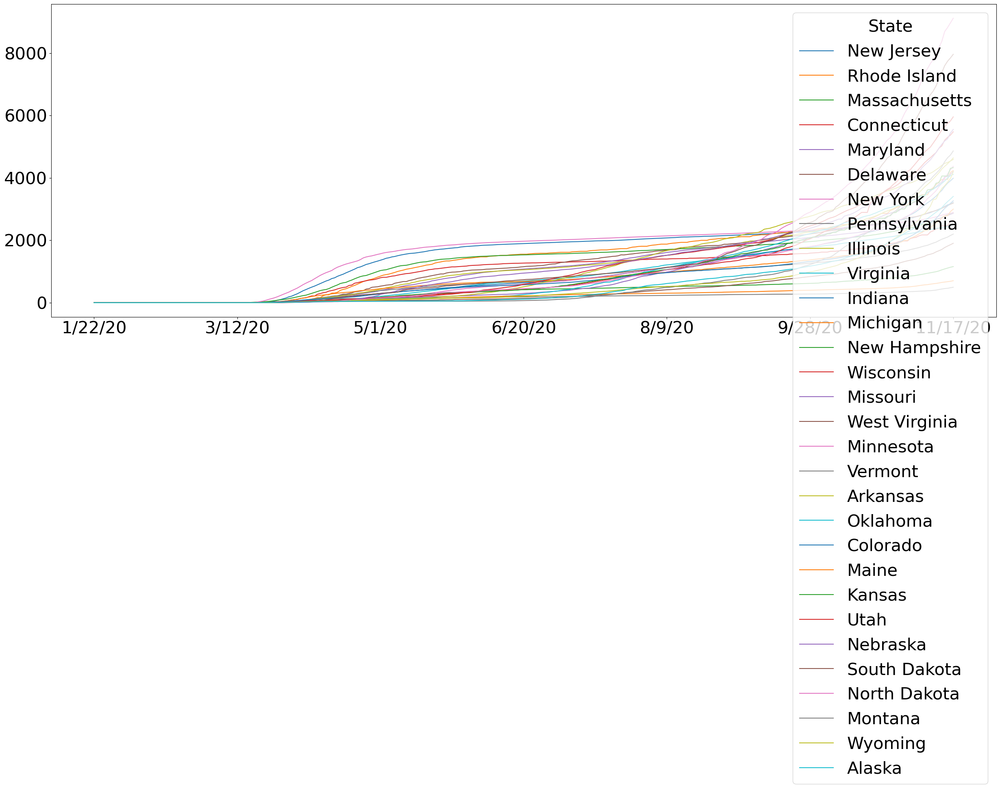

In [71]:
df_adjc[df_adjc.index.isin(non_peak_states)].T.plot(figsize=(30, 10))

<AxesSubplot:xlabel='State'>

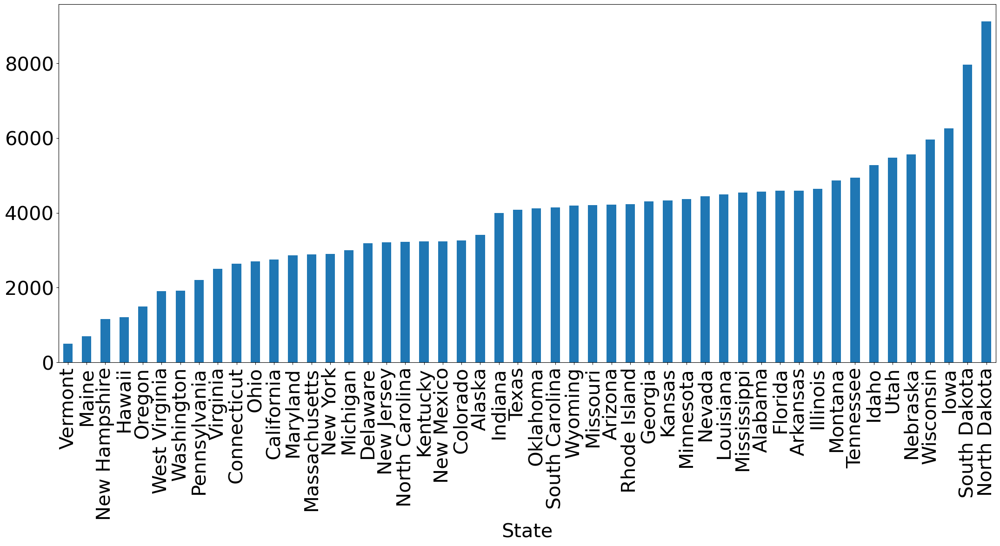

In [72]:
df_adjc.T.max().sort_values().plot(kind='bar', figsize=(26, 10)) # states ranked by worst infection rates

In [73]:
def transform_case_death(df, state, field):
    df_c = df[df.Province_State == state][['Province_State', *df.columns[11:]]].groupby('Province_State').sum().T.diff().rolling(7).mean().reset_index()
    df_c.columns = ['date', field]
    df_c['date'] = df_c['date'].apply(dtparse)
    df_c[field] = df_c[field].fillna(0).apply(int)
    mx = df_c[field].max()
    df_c[field] = df_c[field].values |> minmax_scale
    df_c[field] = df_c[field].apply(->_ * 100 |> int)
    return mx, df_c
    
def mob_cases(s):
    df_s = df_states[[('m50_index', s)]]
    df_s = df_s.rolling(7).mean().reset_index()
    df_s.columns = ['date', 'mobility']
    df_s.date = df_s.date.apply(dtparse)
    mxc, df_c = transform_case_death(df_cases, s, 'cases')
    #mxd, df_d = transform_case_death(df_deaths, s, 'deaths')
    
    df_res = df_s.set_index('date').join(df_c.set_index('date'), how='left')#.join(df_d.set_index('date'), how='left')
    return df_res, mxc

In [74]:
def safe_default(v):
    def decorator(f):
        def applicator(*args, **kwargs):
            try:
                return f(*args,**kwargs)
            except:
                 return v
        return applicator
    return decorator

In [75]:
# max cases vs. max mobility

st_dt, end_dt = '2020-03-01', '2020-12-28'

df_adjcT = df_adjc.T
df_adjcT.index = df_adjcT.index |> pd.to_datetime
df_sc = pd.DataFrame(df_adjcT[(df_adjcT.index > st_dt |> pd.to_datetime) & (df_adjcT.index < end_dt |> pd.to_datetime)].max(), columns=['cases100K'])

@safe_default('')
def process(s):
    df = mob_cases(s.name)[0]
    df['month'] = df.index.map(->_.strftime('%m'))
    return round(df[['mobility', 'month']].groupby('month').median().max().values[0], 2)

df_sc['max_mob'] = df_sc.apply(process, axis=1)
df_sc['cases_n'] = ((df_sc.cases100K |> minmax_scale) * 4).round(2)

In [76]:
df_sc.reset_index()[['cases100K', 'max_mob']].corr()

,cases100K,max_mob
cases100K,1.000000,0.584653
max_mob,0.584653,1.000000


In [77]:
df_adjcT.to_csv('Adj.csv')

In [78]:
df_sc.to_csv('sc.csv')

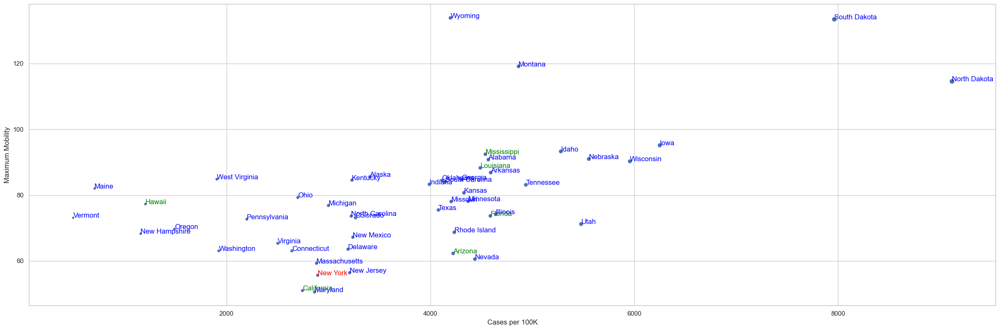

In [79]:
reset_plot_settings()
fig = plt.figure()
fig.set_size_inches(24, 8)
#ax = df_sc2.plot.scatter(x='cases100K', y='max_mob', figsize=(27, 10), s='max_mob_n', cmap='PuOr', alpha=0.4)

sns.set(font_scale=1)
sns.set_style('whitegrid')
g = sns.scatterplot(data=df_sc, x='cases100K', y='max_mob', size='cases_n', legend=False)
g.set_xlabel('Cases per 100K')
g.set_ylabel('Maximum Mobility')
for k, v in df_sc.iterrows():
    #c = 'lightblue' if k in peak_states else 'grey'
    if k in g1:
        c = 'red'
    elif k in g2:
        c = 'green'
    elif k in g3:
        c = 'blue'
    g.annotate(k, (v['cases100K'], v['max_mob']), color=c)
plt.tight_layout()
#g.get_figure().savefig('StateScatterGroups.png', dpi=600)

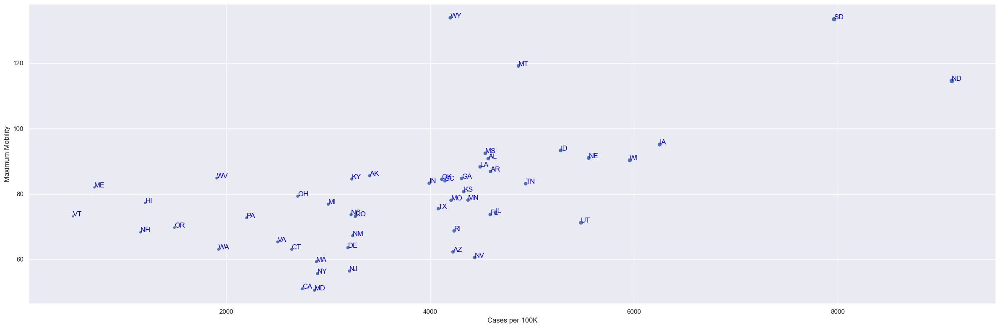

In [80]:
reset_plot_settings()
fig = plt.figure()
fig.set_size_inches(24, 8)
sns.set(font_scale=1)
sns.set_style('darkgrid')
g = sns.scatterplot(data=df_sc, x='cases100K', y='max_mob', size='cases_n', legend=False)
g.set_xlabel('Cases per 100K')
g.set_ylabel('Maximum Mobility')
for k, v in df_sc.iterrows():
    g.annotate(us.states.lookup(k).abbr, (v['cases100K'], v['max_mob']), color=c)
plt.tight_layout()
g.get_figure().savefig('StateScatterGroups2.png', dpi=600)

In [81]:
#df_spp = df_s[['state', 'Peak Time', 'Peak Group']]
df_spp = df_s[['state', 'peak', 'Peak Group']]
df_scm = df_spp.merge(df_sc.reset_index(), left_on='state', right_on='State')

<AxesSubplot:xlabel='cases100K', ylabel='max_mob'>

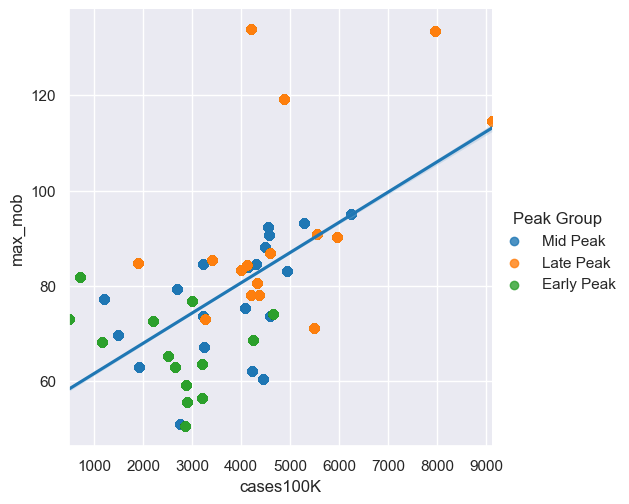

In [82]:
sns.set_palette('tab10')
g = sns.lmplot(data=df_scm.reset_index(), x='cases100K', y='max_mob', hue='Peak Group', fit_reg=False)
sns.regplot(data=df_scm.reset_index(), x='cases100K', y='max_mob', scatter=False, ax=g.axes[0,0])

In [83]:
df_us = gpd.read_file('cb2018/cb_2018_us_state_500k.shp')
df_sp2 = pd.read_excel('Correlation_DesCartes_Incidence_Phases_Actual_Spearman.xlsx', 'Phase2', usecols=['state', 'peak'])

In [84]:
df_us['geonum'] = df_us.GEOID.apply(int)
df_us = df_us[(df_us.geonum < 60) & (df_us.geonum != 2) & (df_us.geonum != 15)].sort_values(by='geonum').copy()

In [85]:
df_map = df_sp2.merge(df_us[['NAME', 'geometry']], left_on='state', right_on='NAME')[['state', 'peak', 'geometry']]

def process(p):
    if p < 7:
        return '1. Early Peak'
    elif p < 9:
        return '2. Mid Peak'
    else:
        return '3. Late Peak'

df_map['grp'] = df_map.peak.apply(process)
df_map = gpd.GeoDataFrame(df_map)

In [86]:
df_map.head()

,state,peak,geometry,grp
0,Alabama,7,"MULTIPOLYGON (((-88.05338 30.50699, -88.05109 ...",2. Mid Peak
1,Arizona,7,"POLYGON ((-114.81629 32.50804, -114.81432 32.5...",2. Mid Peak
2,Arkansas,9,"POLYGON ((-94.61783 36.49941, -94.61765 36.499...",3. Late Peak
3,California,7,"MULTIPOLYGON (((-118.60442 33.47855, -118.5987...",2. Mid Peak
4,Colorado,9,"POLYGON ((-109.06025 38.59933, -109.05954 38.7...",3. Late Peak


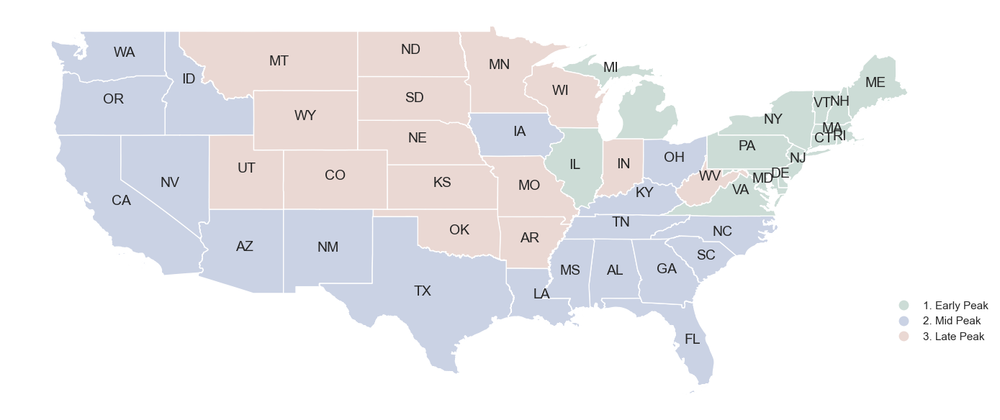

In [87]:
# TODO: Label States. Legend OK at half width. 
df_map['coords'] = df_map['geometry'].apply(->_.representative_point().coords[:])
df_map['coords'] = [coords[0] for coords in df_map['coords']]

with mpl.style.context('seaborn-white'):
    #c = mpl.colors.LinearSegmentedColormap.from_list('', ['#71bc83', '#5aa6c8', '#ec6b58'])
    #c = mpl.colors.LinearSegmentedColormap.from_list('', ['green', 'blue', 'red'])
    c = mpl.colors.LinearSegmentedColormap.from_list('', ['#CCDCD6', '#CAD2E4', '#EAD8D3'])
    ax = df_map.plot(column='grp', cmap = c, legend=True, categorical=True, edgecolor='white', figsize=(20, 6))
    ax.set_xticks([])
    ax.set_yticks([])
    #plt.legend(['grp'], fontsize='xx-large')
    leg = ax.get_legend()
    leg.set_bbox_to_anchor((.85, 0.1, 0.2, 0.2))
    plt.box(on=None)
    for idx, row in df_map.iterrows():
        plt.annotate(text=us.states.lookup(row['state']).abbr, xy=row['coords'], horizontalalignment='center', size=14)
plt.tight_layout()

In [88]:
axsave(ax, 'StatePeakGroupsV3.png')

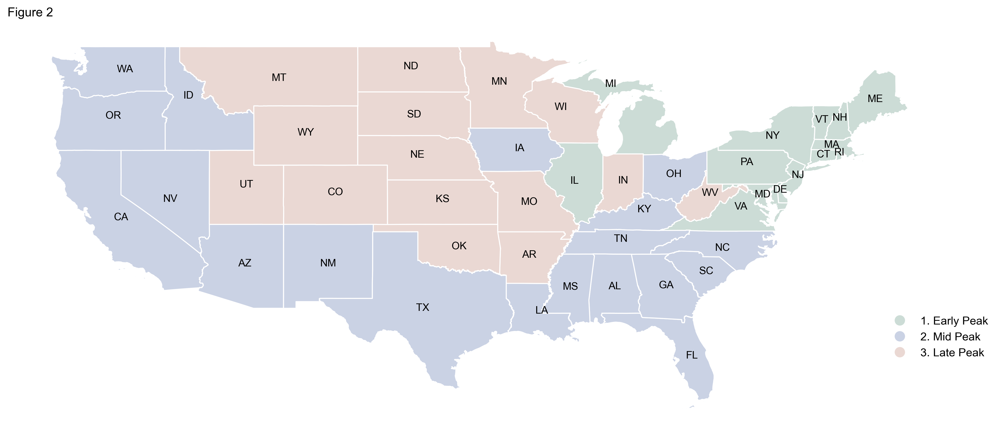

In [89]:
with natrev |> plt.style.context:
    #c = mpl.colors.LinearSegmentedColormap.from_list('', ['#71bc83', '#5aa6c8', '#ec6b58'])
    #c = mpl.colors.LinearSegmentedColormap.from_list('', ['green', 'blue', 'red'])
    c = mpl.colors.LinearSegmentedColormap.from_list('', ['#CCDCD6', '#CAD2E4', '#EAD8D3'])
    ax = df_map.plot(column='grp', cmap = c, legend=True, categorical=True, edgecolor='white', figsize=(20, 6))
    ax.set_xticks([])
    ax.set_yticks([])
    #plt.legend(['grp'], fontsize='xx-large')
    leg = ax.get_legend()
    leg.set_bbox_to_anchor((.85, 0.1, 0.2, 0.2))
    plt.box(on=None)
    for idx, row in df_map.iterrows():
        plt.annotate(text=us.states.lookup(row['state']).abbr, xy=row['coords'], horizontalalignment='center', size=10)
plt.title('Figure 2', loc='left')
plt.tight_layout()

In [90]:
axsave(ax, 'StatePeakGroupsV-Fig2.png')

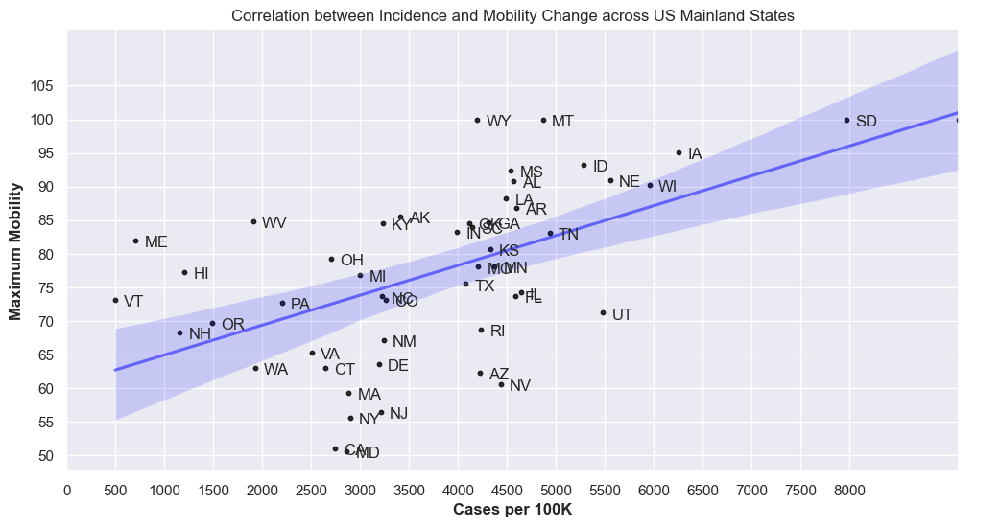

In [91]:
# Figure 2 - Update the mobility chart with label
# Figure 3 - Scatterplot: average descartes Index and percapita cases with regression line (? - Same as above?)
reset_plot_settings()
df_sc2 = df_sc.copy()
df_sc2['max_mob'] = df_sc2['max_mob'].apply(->_ if _ <=100 else 100)

with sns.plotting_context('paper', font_scale=0.8) as c:
    sns.set_style('whitegrid')
    sns.set_style({'font.family': ['Open Sans']})
    sns.set_style({'font.weight': ['bold']})
    sns.set(rc={'figure.figsize':(12, 6)})
    
    # plot
    g = sns.regplot(
        data=df_sc2.reset_index(),
        x='cases100K', y='max_mob', ci=95,
        scatter_kws={'s': 10, 'edgecolor': 'black', 'facecolor': 'black'},
        line_kws={'color': 'blue', 'alpha': 0.5},
        
    )
    g.set_xlabel('Cases per 100K', fontweight='bold', fontsize=12)
    g.set_ylabel('Maximum Mobility', fontweight='bold', fontsize=12)
    g.set_xticks(range(0, 8100, 500))
    g.set_yticks(range(50, 110, 5))
    g.set_title('Correlation between Incidence and Mobility Change across US Mainland States')
    #g.set_xticklabels(rotation=90)
    
    # label points
    for s in df_sc2.index:
        df = df_sc2[df_sc2.index == s].copy()
        x = df.cases100K.values[0]
        y = df.max_mob.values[0]
        g.annotate(us.states.lookup(s).abbr, (df['cases100K'] + 90, df['max_mob'] - 1))
del df_sc2

In [92]:
from scipy import stats

#stats.pearsonr('cases100K', 'max_mob', data=df_sc.reset_index())

In [93]:
axsave(g, 'MobilityIncidenceV3.png')

In [94]:
df_sp = pd.read_excel$('Correlation_DesCartes_Incidence_Phases_Actual_Spearman.xlsx')
for i in range(1, 5+1):
    exec(f"df_sp{i} = df_sp('Phase{i}')")

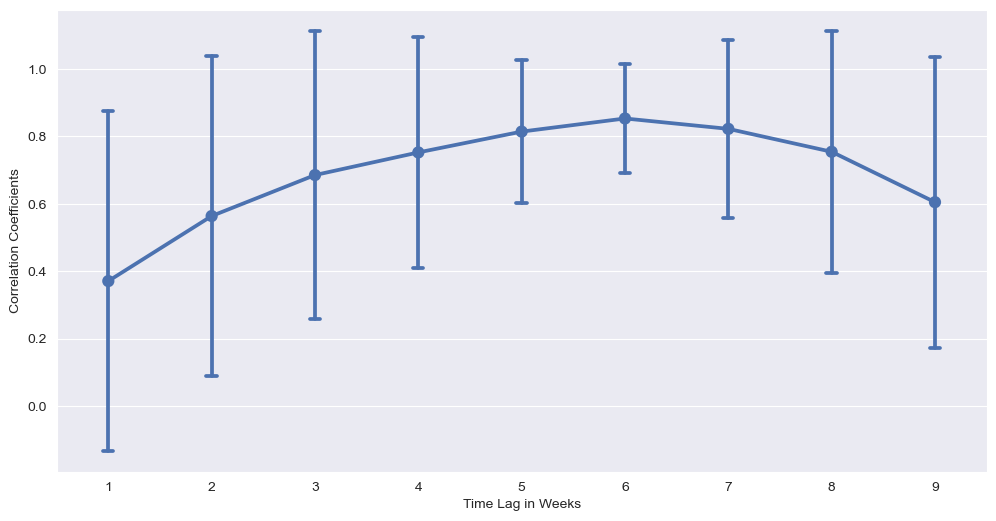

In [95]:
# Figure 5 - All correlations lag 0-8 as time series with confidence Interval
df_xy = df_sp2[(df_sp2.peak == 7) | (df_sp2.peak == 8)]
df_xy = df_xy.melt(id_vars=['state'], value_vars=np.arange(-1, -10, -1), value_name='corr', var_name='lag')
df_xy.lag = df_xy.lag * -1
ax = sns.pointplot(data=df_xy, x='lag', y='corr', ci='sd', capsize=0.1)
_ = ax.set(xlabel='Time Lag in Weeks', ylabel='Correlation Coefficients')

In [96]:
axsave(ax, 'CorrLag.png')

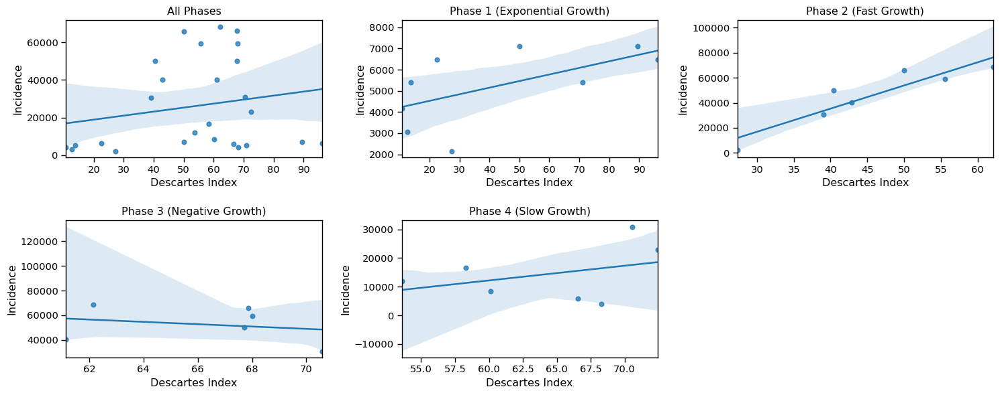

In [97]:
# TODO Add Florida phase graph
reset_plot_settings()
names = ['All Phases', 'Phase 1 (Exponential Growth)', 'Phase 2 (Fast Growth)', 'Phase 3 (Negative Growth)', 'Phase 4 (Slow Growth)',  'Phase 5 (Ending)']

def reg(df, ax, i):
    f = sns.regplot(data=df, x='desCartes', y='Incidence', ax=ax)
    f.set_title(names[i])
    f.set_xlabel('Descartes Index')
    f.set_ylabel('Incidence')

slices = phase_slices('Florida')
df = df_cons[df_cons.state == 'Florida'][['week', 'desCartes', 'Incidence']]
df.desCartes = df.desCartes.shift(6)
df = df.iloc[6:]

with sns.plotting_context('paper', font_scale=1.2) as c:
    fig, axes = plt.subplots(2, 3, figsize=(15, 6))
    faxes = axes.flatten()
    #display(df)
    reg(df, faxes[0], 0)
    
    for i, pslice in phase_slices('Florida') |> enumerate:
        s, e = pslice
        df_ = df[(df.week >= s) & (df.week <= e)]
        reg(df_, faxes[i+1], i+1)

    delete_extra_axes(fig, axes, 1)
plt.tight_layout(h_pad=2, w_pad=2)

In [98]:
fig.savefig('FloridaPhases.png')

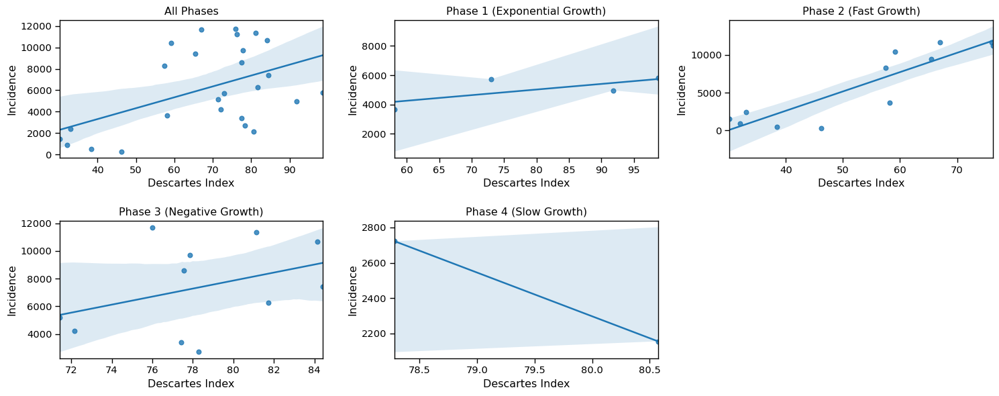

In [99]:
# TODO Add Louisiana phase graph (copy of above cell)
reset_plot_settings()
names = ['All Phases', 'Phase 1 (Exponential Growth)', 'Phase 2 (Fast Growth)', 'Phase 3 (Negative Growth)', 'Phase 4 (Slow Growth)',  'Phase 5 (Ending)']

def reg(df, ax, i):
    f = sns.regplot(data=df, x='desCartes', y='Incidence', ax=ax)
    f.set_title(names[i])
    f.set_xlabel('Descartes Index')
    f.set_ylabel('Incidence')

state = 'Louisiana'
slices = phase_slices(state)
df = df_cons[df_cons.state == state][['week', 'desCartes', 'Incidence']]
df.desCartes = df.desCartes.shift(6)
df = df.iloc[6:]

with sns.plotting_context('paper', font_scale=1.2) as c:
    fig, axes = plt.subplots(2, 3, figsize=(15, 6))
    faxes = axes.flatten()
    #display(df)
    reg(df, faxes[0], 0)

    for i, pslice in phase_slices(state) |> enumerate:
        s, e = pslice
        df_ = df[(df.week >= s) & (df.week <= e)]
        reg(df_, faxes[i+1], i+1)

    delete_extra_axes(fig, axes, 1)
plt.tight_layout(h_pad=2, w_pad=2)

In [100]:
fig.savefig('LouisianaPhases.png')

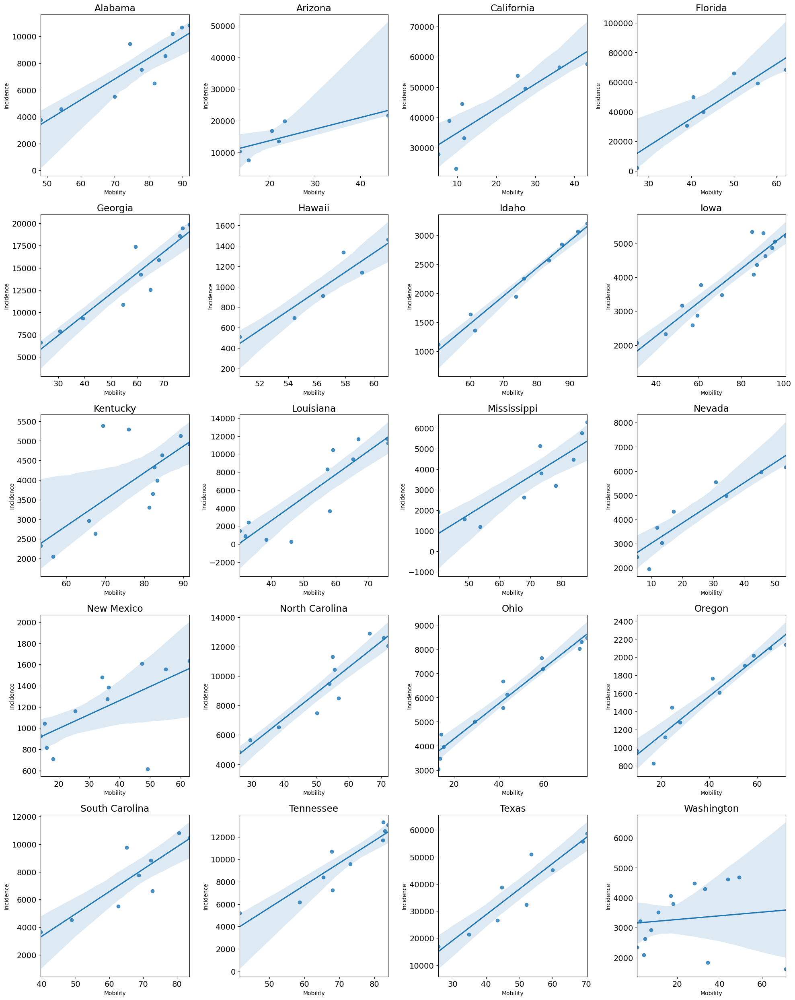

In [101]:
# Figure 6 - Matrix of scatter plots for lag 6 between Incidence rate and mobility during phase 2
reset_plot_settings()
fig, axes = plt.subplots(6, 4, figsize=(20, 30)) # sharex=True, sharey=True
#plt.subplots_adjust(hspace=0.7)
plt.title('Figure 4', loc='left')
plt.rcParams.update({'font.size': 14})
faxes = axes.flatten()
plt.xlabel('Descartes Index')
plt.ylabel('Incidence')

for i, state in df_xy.state.unique() |> sorted |> enumerate:
    df = df_cons[df_cons.state == state][['week', 'desCartes', 'Incidence']]
    df.desCartes = df.desCartes.shift(6)
    df = df.iloc[6:]
    s, e = phase_slices(state)[1]
    df_ = df[(df.week >= s) & (df.week <= e)]
    df_ = df_.rename(columns = {'desCartes': 'Mobility'}).copy()
    ax = faxes[i]
    ax.set_title(state)
    with sns.plotting_context(font_scale=1):
        f = sns.regplot(data=df_, x='Mobility', y='Incidence', ax=ax)
        f.tick_params(labelsize=14)
    #f.set(xlabel=None)
    #f.set(ylabel=None)

plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)

plt.xlabel('Mobility')
plt.ylabel('Incidence')
plt.tight_layout()
foreach(fig.delaxes, faxes[-4:])
mpl.rcdefaults() 

In [102]:
fig.savefig('SecondPeakStates.png', dpi=600)

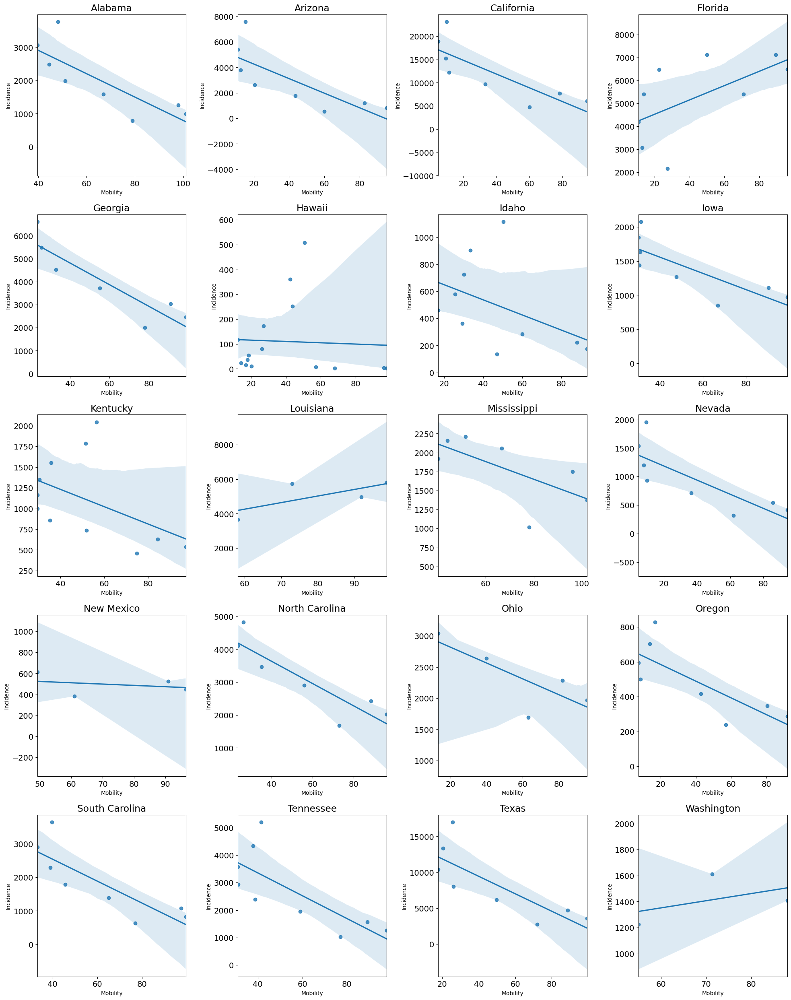

In [103]:
# Do this for PHASE I

# Figure 6 - Matrix of scatter plots for lag 6 between Incidence rate and mobility during phase 2
reset_plot_settings()
fig, axes = plt.subplots(6, 4, figsize=(20, 30)) # sharex=True, sharey=True
#plt.subplots_adjust(hspace=0.7)
plt.title('Figure 4', loc='left')
plt.rcParams.update({'font.size': 14})
faxes = axes.flatten()
plt.xlabel('Descartes Index')
plt.ylabel('Incidence')

for i, state in df_xy.state.unique() |> sorted |> enumerate:
    df = df_cons[df_cons.state == state][['week', 'desCartes', 'Incidence']]
    df.desCartes = df.desCartes.shift(6)
    df = df.iloc[6:]
    s, e = phase_slices(state)[0]
    df_ = df[(df.week >= s) & (df.week <= e)]
    df_ = df_.rename(columns = {'desCartes': 'Mobility'}).copy()
    ax = faxes[i]
    ax.set_title(state)
    with sns.plotting_context(font_scale=1):
        f = sns.regplot(data=df_, x='Mobility', y='Incidence', ax=ax)
        f.tick_params(labelsize=14)
    #f.set(xlabel=None)
    #f.set(ylabel=None)

plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)

plt.xlabel('Mobility')
plt.ylabel('Incidence')
plt.tight_layout()
foreach(fig.delaxes, faxes[-4:])
mpl.rcdefaults() 

In [104]:
fig.savefig('PhaseI.png')

C:\Anaconda\envs\ds\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


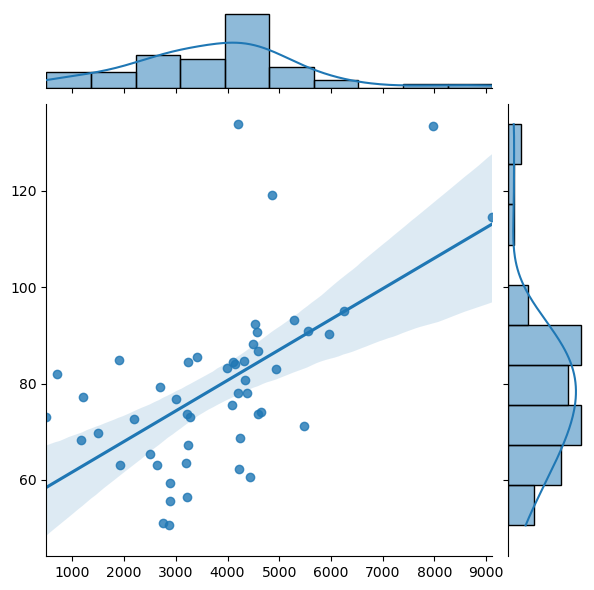

In [105]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2

g = sns.jointplot(df_sc['cases100K'].values, df_sc['max_mob'].values, kind='reg')

In [106]:
df_sc[['cases100K', 'max_mob']].values |> stats.spearmanr

SpearmanrResult(correlation=0.58504610132767, pvalue=8.118808887864002e-06)

In [107]:
fig.savefig('StateMobCases.png')

In [108]:
all_data['Alabama'].head()

,cases,desCartes,Incidence
startDayWeek,,,
2020-02-24,0.000000,0.643478,0.000000
2020-03-02,0.000000,0.836025,0.000000
2020-03-09,0.001266,1.000000,0.027411
2020-03-16,0.009982,0.701863,0.034979
2020-03-23,0.050134,0.295652,0.044670


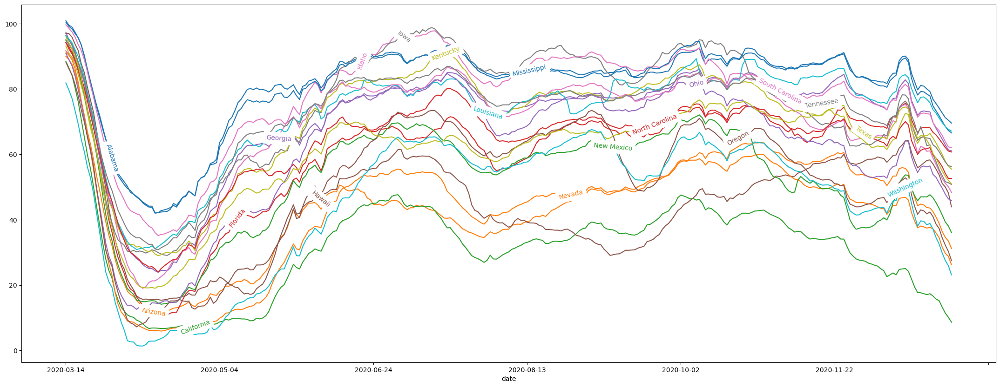

In [109]:
df = df_states.T.reset_index().drop(columns=['level_0'])
df[df.state.isin(peak_states)].set_index('state').T.rolling(14).mean().dropna().round(2).plot(legend=False, figsize=(27, 10))
_ = labelLines(plt.gca().get_lines(), zorder=2.5)

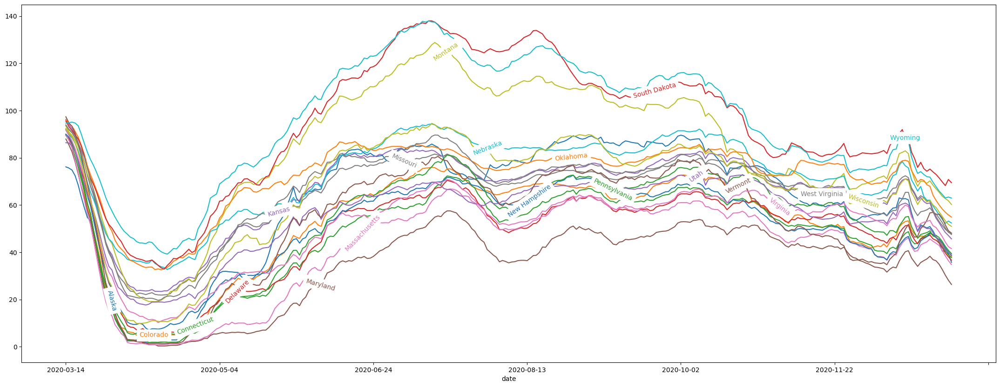

In [110]:
df = df_states.T.reset_index().drop(columns=['level_0'])
ax = df[df.state.isin(non_peak_states[:20])].set_index('state').T.rolling(14).mean().dropna().round(2).plot(legend=False, figsize=(27, 10))
_ = labelLines(plt.gca().get_lines(), zorder=2.5)

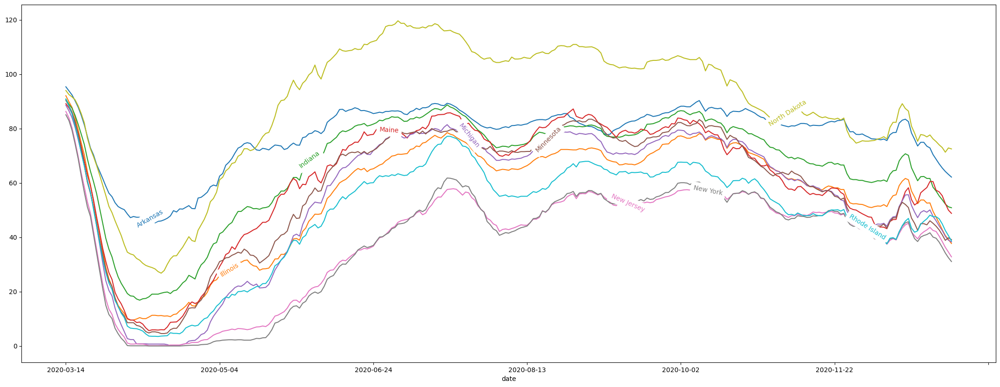

In [111]:
df = df_states.T.reset_index().drop(columns=['level_0'])
ax = df[df.state.isin(non_peak_states[20:])].set_index('state').T.rolling(14).mean().dropna().round(2).plot(legend=False, figsize=(27, 10))
_ = labelLines(plt.gca().get_lines(), zorder=2.5)